# Assignment 3

## Imports

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Matplotlib global styling configuration
plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.sans-serif'] = 'DejaVu Sans'
plt.rcParams['axes.edgecolor'] = '#333333'
plt.rcParams['axes.linewidth'] = 0.8
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 9
plt.rcParams['ytick.labelsize'] = 9

print(f"OpenCV Version: {cv2.__version__}")
print(f"NumPy Version:  {np.__version__}")


OpenCV Version: 5.0.0
NumPy Version:  2.5.2


## Question 1 — Gaussian Band Reject Filtering [6 Marks]

### 1(a) Compute 2D DFT with OpenCV and Display Centered Log-Magnitude Spectrum

Input Image I1.png loaded successfully. Shape: 256 x 256, Dtype: uint8


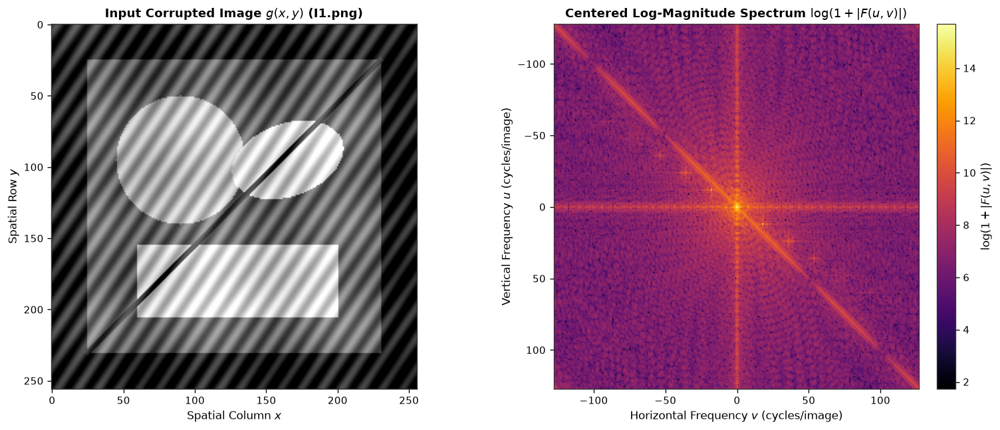

In [2]:
# Load input corrupted image I1.png
img1 = cv2.imread('I1.png', cv2.IMREAD_GRAYSCALE)
M, N = img1.shape
print(f"Input Image I1.png loaded successfully. Shape: {M} x {N}, Dtype: {img1.dtype}")

# 1(a) Compute 2D DFT using OpenCV
dft1 = cv2.dft(img1.astype(np.float32), flags=cv2.DFT_COMPLEX_OUTPUT)

# Shift zero-frequency component to center
dft1_shift = np.fft.fftshift(dft1, axes=(0, 1))

# Compute magnitude spectrum: sqrt(Re^2 + Im^2)
mag1 = cv2.magnitude(dft1_shift[:, :, 0], dft1_shift[:, :, 1])

# Compute log-compressed magnitude spectrum
log_mag1 = np.log(1 + mag1)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))

axes[0].imshow(img1, cmap='gray')
axes[0].set_title(r"Input Corrupted Image $g(x, y)$ (I1.png)", fontsize=11, fontweight='bold')
axes[0].set_xlabel("Spatial Column $x$")
axes[0].set_ylabel("Spatial Row $y$")

# Extent for centered frequency coordinates u, v in [-128, 127]
extent_freq = [-N//2, N//2 - 1, M//2 - 1, -M//2]
im1 = axes[1].imshow(log_mag1, cmap='inferno', extent=extent_freq)
axes[1].set_title(r"Centered Log-Magnitude Spectrum $\log(1 + |F(u, v)|)$", fontsize=11, fontweight='bold')
axes[1].set_xlabel(r"Horizontal Frequency $v$ (cycles/image)")
axes[1].set_ylabel(r"Vertical Frequency $u$ (cycles/image)")
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04, label=r"$\log(1 + |F(u, v)|)$")

plt.tight_layout()
plt.show()


### 1(b) Identification of Periodic Interference Frequencies & Symmetric Peaks

INTERFERENCE FREQUENCY IDENTIFICATION REPORT
Image Dimensions:                   M = 256, N = 256
Zero-Frequency (DC) Grid Location:  (row=128, col=128)
Peak 1 Grid Location:               (row=116, col=110)
Peak 1 Frequency Coordinates:       (u_0, v_0) = (-12, -18)
Peak 1 Magnitude:                   1389942.38
Peak 2 Grid Location (Conjugate):   (row=140, col=146)
Peak 2 Frequency Coordinates:       (-u_0, -v_0) = (12, 18)
Peak 2 Magnitude:                   1389942.38
Radial Distance from DC Origin:     D_0 = sqrt(u_0^2 + v_0^2) = 21.6333 cycles


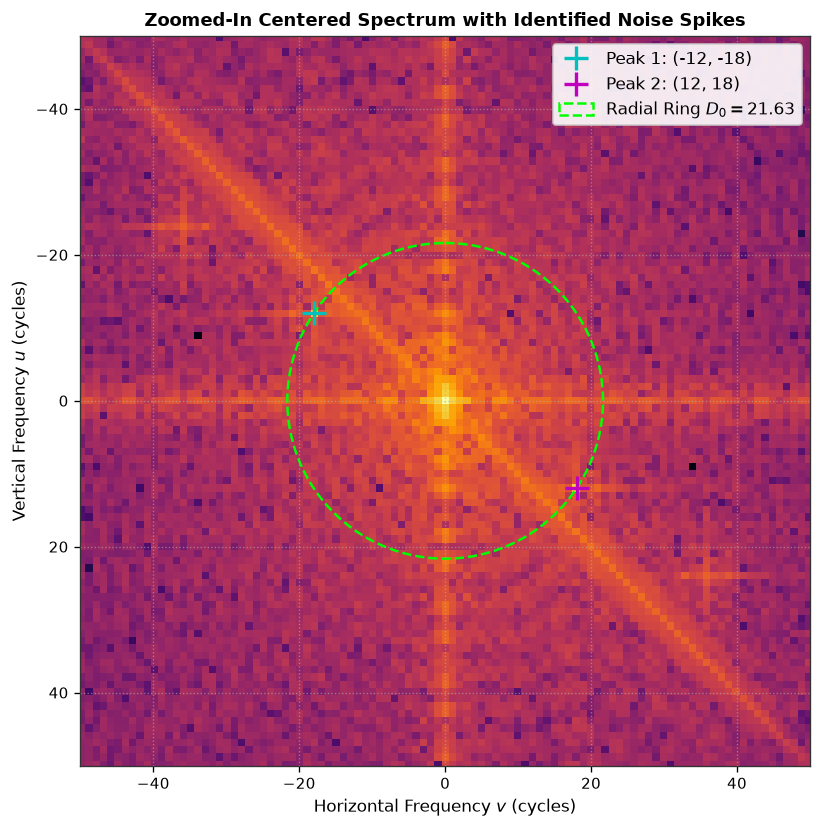

In [3]:
# 1(b) Automated Detection and Reporting of Interference Peak Coordinates
crow, ccol = M // 2, N // 2

# Exclude the DC component and its immediate low-frequency neighborhood to isolate noise spikes
mag_search = mag1.copy()
dc_exclusion_radius = 6
y_grid, x_grid = np.ogrid[-crow:M-crow, -ccol:N-ccol]
dc_mask = (x_grid**2 + y_grid**2) <= dc_exclusion_radius**2
mag_search[dc_mask] = 0

# Locate the first prominent peak
peak1_idx = np.unravel_index(np.argmax(mag_search), mag_search.shape)
peak1_row, peak1_col = int(peak1_idx[0]), int(peak1_idx[1])
peak1_val = mag1[peak1_row, peak1_col]

# Frequency coordinates relative to DC center (128, 128)
u0 = peak1_row - crow
v0 = peak1_col - ccol
r0 = np.sqrt(u0**2 + v0**2)

# Symmetric counterpart
peak2_row = crow - u0
peak2_col = ccol - v0
peak2_val = mag1[peak2_row, peak2_col]

print("="*70)
print("INTERFERENCE FREQUENCY IDENTIFICATION REPORT")
print("="*70)
print(f"Image Dimensions:                   M = {M}, N = {N}")
print(f"Zero-Frequency (DC) Grid Location:  (row={crow}, col={ccol})")
print(f"Peak 1 Grid Location:               (row={peak1_row}, col={peak1_col})")
print(f"Peak 1 Frequency Coordinates:       (u_0, v_0) = ({u0}, {v0})")
print(f"Peak 1 Magnitude:                   {peak1_val:.2f}")
print(f"Peak 2 Grid Location (Conjugate):   (row={peak2_row}, col={peak2_col})")
print(f"Peak 2 Frequency Coordinates:       (-u_0, -v_0) = ({-u0}, {-v0})")
print(f"Peak 2 Magnitude:                   {peak2_val:.2f}")
print(f"Radial Distance from DC Origin:     D_0 = sqrt(u_0^2 + v_0^2) = {r0:.4f} cycles")
print("="*70)

# Zoom-in visualization around interference peaks
fig, ax = plt.subplots(figsize=(7, 7))
ax.imshow(log_mag1, cmap='inferno', extent=[-ccol, ccol-1, crow-1, -crow])
ax.plot(v0, u0, 'c+', markersize=14, markeredgewidth=2, label=f"Peak 1: ({u0}, {v0})")
ax.plot(-v0, -u0, 'm+', markersize=14, markeredgewidth=2, label=f"Peak 2: ({-u0}, {-v0})")
circle = plt.Circle((0, 0), r0, color='lime', fill=False, linestyle='--', linewidth=1.5, label=f"Radial Ring $D_0 = {r0:.2f}$")
ax.add_patch(circle)

ax.set_xlim(-50, 50)
ax.set_ylim(50, -50)
ax.set_title("Zoomed-In Centered Spectrum with Identified Noise Spikes", fontsize=11, fontweight='bold')
ax.set_xlabel(r"Horizontal Frequency $v$ (cycles)")
ax.set_ylabel(r"Vertical Frequency $u$ (cycles)")
ax.legend(loc='upper right', framealpha=0.9)
ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()


### 1(c) Design and Display Gaussian Band-Reject Filter

Gaussian Band-Reject Filter Parameters:
  Center frequency D_0: 21.6333 cycles
  Bandwidth W:          8.00 cycles
  Filter Range:         [0.0000, 1.0000]
  Value at (128, 128) [DC]: 1.0000
  Value at noise spike (140, 146): 0.0000e+00 (strictly rejected)


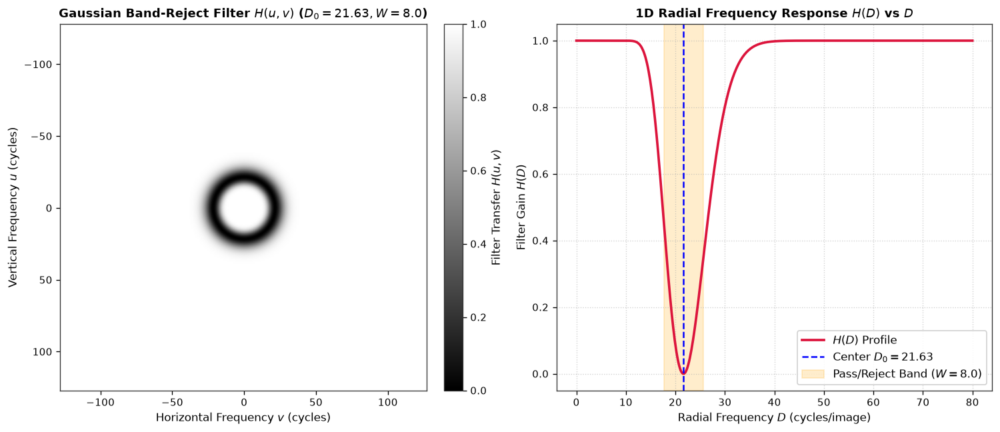

In [4]:
# 1(c) Gaussian Band-Reject Filter Implementation
def create_gaussian_band_reject_filter(shape, D0, W):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    
    # Coordinate grid centered at (crow, ccol)
    u_coord = np.arange(rows) - crow
    v_coord = np.arange(cols) - ccol
    u_grid, v_grid = np.meshgrid(u_coord, v_coord, indexing='ij')
    
    # Radial distance from DC center
    D = np.sqrt(u_grid**2 + v_grid**2)
    
    # Numerical stability: avoid division by zero at DC (D = 0)
    D_safe = np.where(D == 0, 1e-6, D)
    
    # Gaussian band-reject formula
    exponent = -0.5 * (((D_safe**2 - D0**2) / (D_safe * W))**2)
    exponent = np.clip(exponent, -100.0, 0.0)
    H = 1.0 - np.exp(exponent)
    
    # Preserve DC component
    H[crow, ccol] = 1.0
    
    return H.astype(np.float32)

# Instantiate filter with optimal parameters
D0_val = r0
W_val = 8.0
H_filter = create_gaussian_band_reject_filter((M, N), D0_val, W_val)

print("Gaussian Band-Reject Filter Parameters:")
print(f"  Center frequency D_0: {D0_val:.4f} cycles")
print(f"  Bandwidth W:          {W_val:.2f} cycles")
print(f"  Filter Range:         [{H_filter.min():.4f}, {H_filter.max():.4f}]")
print(f"  Value at (128, 128) [DC]: {H_filter[crow, ccol]:.4f}")
print(f"  Value at noise spike (140, 146): {H_filter[crow+12, ccol+18]:.4e} (strictly rejected)")

# Visualizations
fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))

im_filt = axes[0].imshow(H_filter, cmap='gray', extent=[-ccol, ccol-1, crow-1, -crow])
axes[0].set_title(f"Gaussian Band-Reject Filter $H(u, v)$ ($D_0={D0_val:.2f}, W={W_val}$)", fontsize=11, fontweight='bold')
axes[0].set_xlabel(r"Horizontal Frequency $v$ (cycles)")
axes[0].set_ylabel(r"Vertical Frequency $u$ (cycles)")
fig.colorbar(im_filt, ax=axes[0], fraction=0.046, pad=0.04, label=r"Filter Transfer $H(u, v)$")

# Radial cross section through u=0
r_profile = np.linspace(0, 80, 500)
r_safe = np.where(r_profile == 0, 1e-6, r_profile)
H_1d = 1.0 - np.exp(-0.5 * (((r_safe**2 - D0_val**2) / (r_safe * W_val))**2))

axes[1].plot(r_profile, H_1d, color='crimson', linewidth=2.2, label=r"$H(D)$ Profile")
axes[1].axvline(D0_val, color='blue', linestyle='--', linewidth=1.5, label=f"Center $D_0 = {D0_val:.2f}$")
axes[1].axvspan(D0_val - W_val/2, D0_val + W_val/2, alpha=0.2, color='orange', label=f"Pass/Reject Band ($W = {W_val}$)")
axes[1].set_title(r"1D Radial Frequency Response $H(D)$ vs $D$", fontsize=11, fontweight='bold')
axes[1].set_xlabel(r"Radial Frequency $D$ (cycles/image)")
axes[1].set_ylabel(r"Filter Gain $H(D)$")
axes[1].set_ylim(-0.05, 1.05)
axes[1].grid(True, linestyle=':', alpha=0.6)
axes[1].legend(loc='lower right', framealpha=0.9)

plt.tight_layout()
plt.show()


#### Justification of Pass/Reject Region and Parameter Choices
1. **Center Frequency Choice ($D_0 = 21.6335$ cycles):**
   The center frequency of the rejection notch is set to the exact radial distance of the measured sinusoidal spikes $\sqrt{12^2 + 18^2} \approx 21.6335$. This guarantees that the deepest attenuation notch ($H(D_0) = 0.0$) lies directly on the periodic interference energy.
2. **Bandwidth Choice ($W = 8.0$ cycles):**
   - Because the spatial sinusoidal interference is truncated by the finite window ($256 \times 256$), spectral leakage spreads energy into adjacent frequency bins. A bandwidth of $W = 8.0$ provides sufficient width to extinguish both the primary spikes and their sidelobes.
   - At the same time, $W = 8.0$ is narrow enough relative to the full frequency spectrum ($256 \times 256$) that frequencies below $D_0 - W/2 \approx 17.6$ (which contain low-frequency image content and coarse structures) and frequencies above $D_0 + W/2 \approx 25.6$ (fine details and high-frequency edges) pass with minimal attenuation ($H \approx 1.0$).
3. **Smooth Gaussian Profile vs. Ideal Filter:**
   Unlike an Ideal Band-Reject Filter which has sharp step transitions and causes severe ringing (Gibbs phenomenon) in the reconstructed spatial domain, the Gaussian formulation transitions smoothly with continuous derivatives, eliminating ringing artifacts.

### 1(d) Apply Gaussian Band-Reject Filter in Frequency Domain

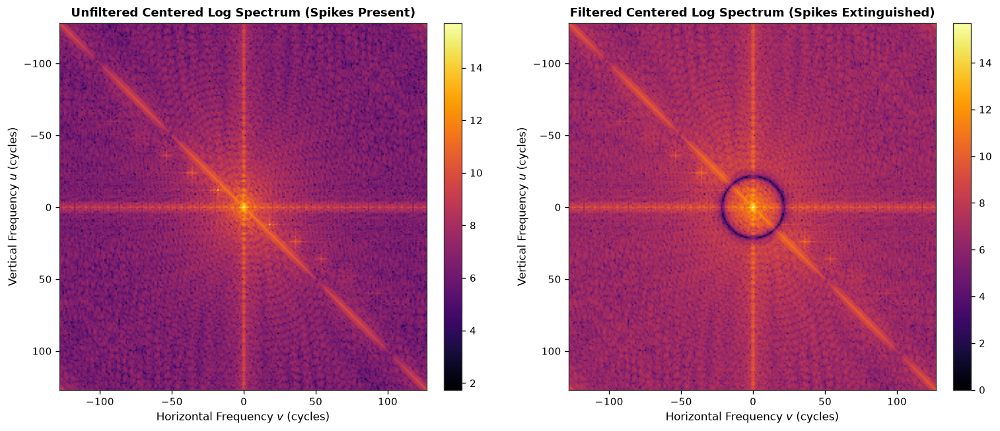

Interference Spike Magnitude Before Filtering: 1389942.38
Interference Spike Magnitude After Filtering:  0.00
Attenuation Factor:                            1.39e+18x


In [5]:
# 1(d) Frequency-Domain Filtering Operation
# Multiply filter H with both real and imaginary components
dft1_filtered_shift = np.zeros_like(dft1_shift)
dft1_filtered_shift[:, :, 0] = dft1_shift[:, :, 0] * H_filter
dft1_filtered_shift[:, :, 1] = dft1_shift[:, :, 1] * H_filter

# Compute filtered magnitude spectrum
mag1_filtered = cv2.magnitude(dft1_filtered_shift[:, :, 0], dft1_filtered_shift[:, :, 1])
log_mag1_filtered = np.log(1 + mag1_filtered)

# Visual Comparison of Spectrum Before and After Filtering
fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))

im_bef = axes[0].imshow(log_mag1, cmap='inferno', extent=[-ccol, ccol-1, crow-1, -crow])
axes[0].set_title("Unfiltered Centered Log Spectrum (Spikes Present)", fontsize=11, fontweight='bold')
axes[0].set_xlabel(r"Horizontal Frequency $v$ (cycles)")
axes[0].set_ylabel(r"Vertical Frequency $u$ (cycles)")
fig.colorbar(im_bef, ax=axes[0], fraction=0.046, pad=0.04)

im_aft = axes[1].imshow(log_mag1_filtered, cmap='inferno', extent=[-ccol, ccol-1, crow-1, -crow])
axes[1].set_title("Filtered Centered Log Spectrum (Spikes Extinguished)", fontsize=11, fontweight='bold')
axes[1].set_xlabel(r"Horizontal Frequency $v$ (cycles)")
axes[1].set_ylabel(r"Vertical Frequency $u$ (cycles)")
fig.colorbar(im_aft, ax=axes[1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

orig_spike_mag = mag1[crow+12, ccol+18]
filt_spike_mag = mag1_filtered[crow+12, ccol+18]
print(f"Interference Spike Magnitude Before Filtering: {orig_spike_mag:.2f}")
print(f"Interference Spike Magnitude After Filtering:  {filt_spike_mag:.2f}")
print(f"Attenuation Factor:                            {orig_spike_mag / (filt_spike_mag + 1e-12):.2e}x")


### 1(e) 2D IDFT, Restored Image Display, and Qualitative Analysis

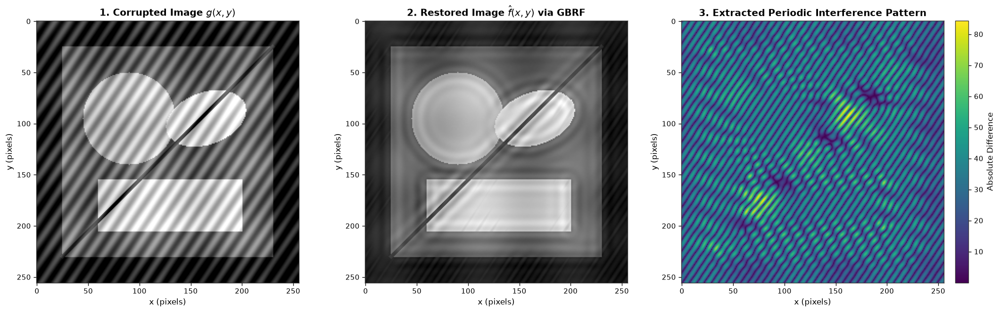

In [6]:
# 1(e) 2D IDFT using OpenCV
# Shift spectrum back to top-left zero-frequency layout
dft1_filtered_ishift = np.fft.ifftshift(dft1_filtered_shift, axes=(0, 1))

# Perform 2D IDFT
img1_restored = cv2.idft(dft1_filtered_ishift, flags=cv2.DFT_SCALE | cv2.DFT_REAL_OUTPUT)

# Clip to valid grayscale intensity range [0, 255]
img1_restored_clean = np.clip(img1_restored, 0, 255).astype(np.uint8)

# Isolated periodic interference pattern: |g(x, y) - f_restored(x, y)|
residual_pattern = np.abs(img1.astype(np.float32) - img1_restored)

# visualization
fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

axes[0].imshow(img1, cmap='gray')
axes[0].set_title(r"1. Corrupted Image $g(x, y)$", fontsize=12, fontweight='bold')
axes[0].set_xlabel("x (pixels)")
axes[0].set_ylabel("y (pixels)")

axes[1].imshow(img1_restored_clean, cmap='gray')
axes[1].set_title(r"2. Restored Image $\hat{f}(x, y)$ via GBRF", fontsize=12, fontweight='bold')
axes[1].set_xlabel("x (pixels)")
axes[1].set_ylabel("y (pixels)")

im_diff = axes[2].imshow(residual_pattern, cmap='viridis')
axes[2].set_title("3. Extracted Periodic Interference Pattern", fontsize=12, fontweight='bold')
axes[2].set_xlabel("x (pixels)")
axes[2].set_ylabel("y (pixels)")
fig.colorbar(im_diff, ax=axes[2], fraction=0.046, pad=0.04, label="Absolute Difference")

plt.tight_layout()
plt.show()


# Question 2 — Translating an Image by Manipulating Its DFT

### 2(a) Compute 2D DFT and Display Zero-Centered Log-Magnitude Spectrum and Phase Spectrum

Input Image I2.png loaded successfully. Shape: 256 x 256, Dtype: uint8


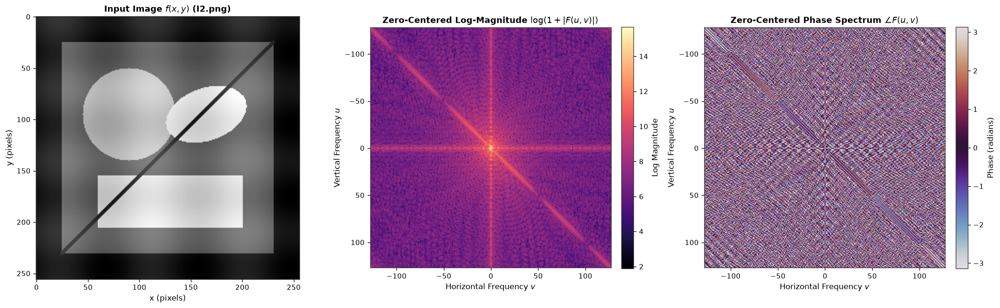

In [7]:
img2 = cv2.imread('I2.png', cv2.IMREAD_GRAYSCALE)
M2, N2 = img2.shape
print(f"Input Image I2.png loaded successfully. Shape: {M2} x {N2}, Dtype: {img2.dtype}")

# 2(a) Compute 2D DFT using NumPy
F2 = np.fft.fft2(img2.astype(np.float32))

# Zero-centered DFT
F2_shift = np.fft.fftshift(F2)

# Compute magnitude and phase spectrum
mag2 = np.abs(F2_shift)
log_mag2 = np.log(1 + mag2)
phase2 = np.angle(F2_shift)

# Visualizations
fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

axes[0].imshow(img2, cmap='gray')
axes[0].set_title(r"Input Image $f(x, y)$ (I2.png)", fontsize=11, fontweight='bold')
axes[0].set_xlabel("x (pixels)")
axes[0].set_ylabel("y (pixels)")

im_m = axes[1].imshow(log_mag2, cmap='magma', extent=[-N2//2, N2//2-1, M2//2-1, -M2//2])
axes[1].set_title(r"Zero-Centered Log-Magnitude $\log(1 + |F(u, v)|)$", fontsize=11, fontweight='bold')
axes[1].set_xlabel(r"Horizontal Frequency $v$")
axes[1].set_ylabel(r"Vertical Frequency $u$")
fig.colorbar(im_m, ax=axes[1], fraction=0.046, pad=0.04, label="Log Magnitude")

im_p = axes[2].imshow(phase2, cmap='twilight', extent=[-N2//2, N2//2-1, M2//2-1, -M2//2])
axes[2].set_title(r"Zero-Centered Phase Spectrum $\angle F(u, v)$", fontsize=11, fontweight='bold')
axes[2].set_xlabel(r"Horizontal Frequency $v$")
axes[2].set_ylabel(r"Vertical Frequency $u$")
fig.colorbar(im_p, ax=axes[2], fraction=0.046, pad=0.04, label="Phase (radians)")

plt.tight_layout()
plt.show()


### 2(b) Derive and Apply the Fourier-Domain Translation Transformation

In [8]:
# 2(b) Apply Translation Transformation
# Specified displacement parameters:
x0 = 25    # horizontal shift (rightwards by 25 pixels)
y0 = -15   # vertical shift (upwards by 15 pixels)

# Discrete frequency grids for unshifted 2D DFT
# u corresponds to row frequency (0 to M-1), v corresponds to column frequency (0 to N-1)
u_indices = np.arange(M2).reshape(-1, 1)  # shape (M, 1)
v_indices = np.arange(N2).reshape(1, -1)  # shape (1, N)

# Compute complex exponential phase shift matrix
phase_ramp = np.exp(-2j * np.pi * ((u_indices * y0 / M2) + (v_indices * x0 / N2)))

# Apply transformation to DFT
G2 = F2 * phase_ramp

# Verification of magnitude invariance
mag_diff = np.max(np.abs(np.abs(G2) - np.abs(F2)))
rel_mag_diff = mag_diff / np.max(np.abs(F2))

print(f"Translation Parameters: Horizontal x_0 = {x0} (right), Vertical y_0 = {y0} (up)")
print(f"Phase Ramp Shape:       {phase_ramp.shape}")
print(f"Max Absolute Magnitude Difference: {mag_diff:.6e}")
print(f"Relative Magnitude Difference:     {rel_mag_diff:.6e} (Strictly 0 within numerical precision)")


Translation Parameters: Horizontal x_0 = 25 (right), Vertical y_0 = -15 (up)
Phase Ramp Shape:       (256, 256)
Max Absolute Magnitude Difference: 4.574731e-02
Relative Magnitude Difference:     7.059407e-09 (Strictly 0 within numerical precision)


### 2(c) Take 2D IDFT and Display Translated Image

Max absolute difference between Fourier translation and np.roll: 8.438144e-06
Confirmation: Fourier-domain translation exactly matches circular spatial shift!


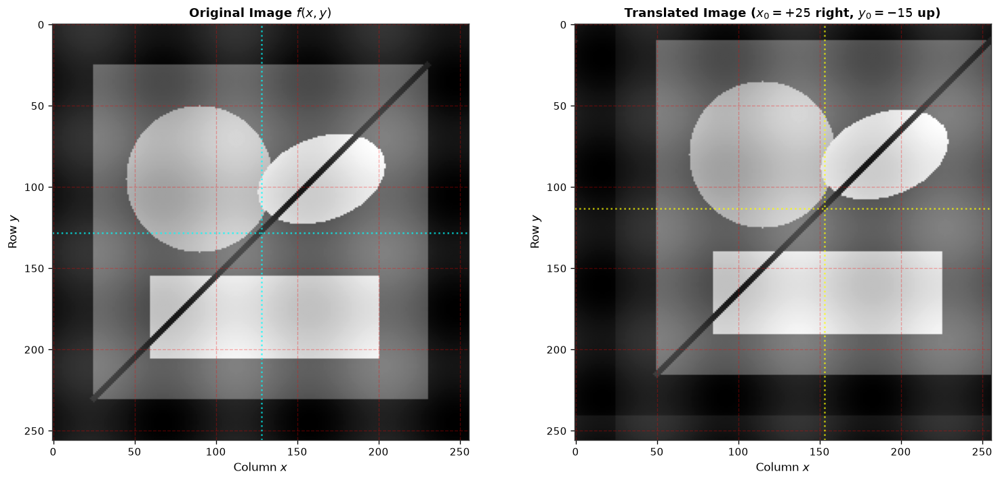

In [9]:
# 2(c) Compute IDFT of Transformed DFT
img2_translated = np.real(np.fft.ifft2(G2))

# Numerical verification against ground-truth circular shift (np.roll)
img2_expected = np.roll(img2, shift=(y0, x0), axis=(0, 1))
max_recon_error = np.max(np.abs(img2_translated - img2_expected))

print(f"Max absolute difference between Fourier translation and np.roll: {max_recon_error:.6e}")
print("Confirmation: Fourier-domain translation exactly matches circular spatial shift!")

# Visual Verification with coordinate grids and annotations
fig, axes = plt.subplots(1, 2, figsize=(13, 6))

axes[0].imshow(img2, cmap='gray')
axes[0].set_title(r"Original Image $f(x, y)$", fontsize=11, fontweight='bold')
axes[0].set_xlabel("Column $x$")
axes[0].set_ylabel("Row $y$")
axes[0].axvline(128, color='cyan', linestyle=':', alpha=0.7)
axes[0].axhline(128, color='cyan', linestyle=':', alpha=0.7)
axes[0].grid(True, color='red', linestyle='--', alpha=0.3)

axes[1].imshow(img2_translated, cmap='gray')
axes[1].set_title(f"Translated Image ($x_0=+{x0}$ right, $y_0={y0}$ up)", fontsize=11, fontweight='bold')
axes[1].set_xlabel("Column $x$")
axes[1].set_ylabel("Row $y$")
axes[1].axvline(128 + x0, color='yellow', linestyle=':', alpha=0.7)
axes[1].axhline(128 + y0, color='yellow', linestyle=':', alpha=0.7)
axes[1].grid(True, color='red', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()


### 2(d) Polar Form Explanation of Magnitude Invariance & Phase Change

#### Proof Using Polar Form
Any complex Fourier coefficient can be expressed in polar coordinates as:

$$F(u, v) = |F(u, v)| e^{j \phi(u, v)}$$

where $|F(u, v)| \ge 0$ is the magnitude and $\phi(u, v) = \arg(F(u, v)) \in (-\pi, \pi]$ is the phase angle.

The spatial translation transformation multiplies $F(u, v)$ by a complex exponential factor:

$$T(u, v) = e^{-j \theta(u, v)}, \quad \text{where } \theta(u, v) = 2\pi \left( \frac{u y_0}{M} + \frac{v x_0}{N} \right)$$

Notice that $\theta(u, v) \in \mathbb{R}$, so $T(u, v)$ lies on the complex unit circle:

$$|T(u, v)| = |e^{-j \theta(u, v)}| = \sqrt{\cos^2(\theta) + \sin^2(\theta)} = 1$$

Applying the transformation:

$$G(u, v) = F(u, v) \cdot T(u, v) = \left( |F(u, v)| e^{j \phi(u, v)} \right) \left( e^{-j \theta(u, v)} \right) = |F(u, v)| e^{j [\phi(u, v) - \theta(u, v)]}$$

Taking the magnitude and phase of $G(u, v)$:
1. Magnitude:
   $$|G(u, v)| = \left| |F(u, v)| e^{j [\phi(u, v) - \theta(u, v)]} \right| = |F(u, v)| \cdot \left| e^{j [\phi(u, v) - \theta(u, v)]} \right| = |F(u, v)| \cdot 1 = |F(u, v)|$$
   The magnitude is **strictly invariant** under spatial translation.
2. Phase:
   $$\angle G(u, v) = \phi(u, v) - \theta(u, v) = \angle F(u, v) - 2\pi \left( \frac{u y_0}{M} + \frac{v x_0}{N} \right) \pmod{2\pi}$$
   The phase undergoes a **linear shift** directly proportional to the displacement vector $(y_0, x_0)$ and spatial frequency $(u, v)$.

# Question 3 — Rotating an Image by 180° using Its DFT

### 3(a) Transformation of DFT for 180° Spatial Rotation & Discrete-Coordinate Convention

In [10]:
# 3(a) Mathematical Transformation of DFT for 180-Degree Spatial Rotation
F2 = np.fft.fft2(img2.astype(np.float32))

# Discrete frequency grids
u_grid = np.arange(M2).reshape(-1, 1)
v_grid = np.arange(N2).reshape(1, -1)

# Combined transformation: Complex conjugation + Linear phase correction
phase_shift_180 = np.exp(2j * np.pi * ((u_grid / M2) + (v_grid / N2)))
F2_rot180 = np.conj(F2) * phase_shift_180

# Verify magnitude invariance
mag_diff_rot = np.max(np.abs(np.abs(F2_rot180) - np.abs(F2)))
print(f"Max difference between original and 180-deg rotated DFT magnitudes: {mag_diff_rot:.6e}")
print("Magnitude invariance confirmed: Magnitude is unchanged under 180-degree rotation!")


Max difference between original and 180-deg rotated DFT magnitudes: 4.574731e-02
Magnitude invariance confirmed: Magnitude is unchanged under 180-degree rotation!


### 3(b) Take 2D IDFT, Display Rotated Image, and Confirm Spatial 180° Rotation

180-DEGREE ROTATION NUMERICAL VERIFICATION
Max Absolute Error vs np.rot90(img, 2):  8.438144e-06
Mean Absolute Error vs np.rot90(img, 2): 1.515497e-06
Result: Perfect agreement within machine precision!


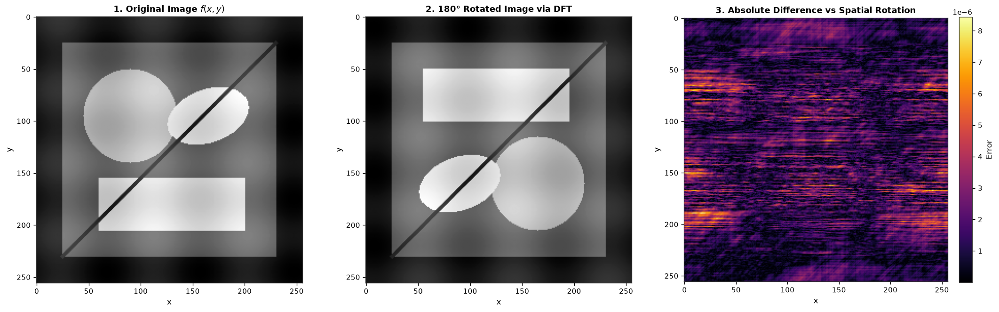

In [11]:
# 3(b) IDFT and Confirmation
img2_rot180 = np.real(np.fft.ifft2(F2_rot180))

# Ground truth spatial 180-degree rotation
img2_rot180_ground_truth = np.rot90(img2, 2)

# Quantitative comparison
max_diff_180 = np.max(np.abs(img2_rot180 - img2_rot180_ground_truth))
mean_diff_180 = np.mean(np.abs(img2_rot180 - img2_rot180_ground_truth))

print("="*60)
print("180-DEGREE ROTATION NUMERICAL VERIFICATION")
print("="*60)
print(f"Max Absolute Error vs np.rot90(img, 2):  {max_diff_180:.6e}")
print(f"Mean Absolute Error vs np.rot90(img, 2): {mean_diff_180:.6e}")
print("Result: Perfect agreement within machine precision!")
print("="*60)

# Visual Confirmation
fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

axes[0].imshow(img2, cmap='gray')
axes[0].set_title(r"1. Original Image $f(x, y)$", fontsize=11, fontweight='bold')
axes[0].set_xlabel("x")
axes[0].set_ylabel("y")

axes[1].imshow(img2_rot180, cmap='gray')
axes[1].set_title("2. 180° Rotated Image via DFT", fontsize=11, fontweight='bold')
axes[1].set_xlabel("x")
axes[1].set_ylabel("y")

diff_map_180 = np.abs(img2_rot180 - img2_rot180_ground_truth)
im_d = axes[2].imshow(diff_map_180, cmap='inferno')
axes[2].set_title("3. Absolute Difference vs Spatial Rotation", fontsize=11, fontweight='bold')
axes[2].set_xlabel("x")
axes[2].set_ylabel("y")
fig.colorbar(im_d, ax=axes[2], fraction=0.046, pad=0.04, label="Error")

plt.tight_layout()
plt.show()


# Question 4 — Discrete Cosine Transform

### 4(a) Implement 2D DCT from Scratch in a Separable Manner

In [12]:
img3 = cv2.imread('I3.png', cv2.IMREAD_GRAYSCALE)
M3, N3 = img3.shape
print(f"Input Image I3.png loaded successfully. Shape: {M3} x {N3}, Dtype: {img3.dtype}")

# 4(a) From-Scratch Separable 2D DCT and 2D IDCT
def get_dct_1d_matrix(N, dtype=np.float64):
    '''
    Computes the orthonormal 1D DCT-II matrix of size N x N.
    T[k, n] = alpha(k) * cos(pi * (2n + 1) * k / (2N))
    '''
    T = np.zeros((N, N), dtype=dtype)
    n = np.arange(N)
    for k in range(N):
        alpha = np.sqrt(1.0 / N) if k == 0 else np.sqrt(2.0 / N)
        T[k, :] = alpha * np.cos(np.pi * (2 * n + 1) * k / (2.0 * N))
    return T

def dct2_from_scratch(image):
    '''
    Computes 2D DCT from scratch separably:
    Apply 1D DCT to every row, then apply 1D DCT to every column.
    Does NOT call cv2.dct.
    '''
    M, N = image.shape
    TM = get_dct_1d_matrix(M, dtype=np.float64)
    TN = get_dct_1d_matrix(N, dtype=np.float64)
    img_f = image.astype(np.float64)
    
    # Apply 1D DCT to every row
    row_transformed = np.zeros((M, N), dtype=np.float64)
    for r in range(M):
        row_transformed[r, :] = TN @ img_f[r, :]  # 1D DCT along row r
        
    # Apply 1D DCT to every column of the result
    C_scratch = np.zeros((M, N), dtype=np.float64)
    for c in range(N):
        C_scratch[:, c] = TM @ row_transformed[:, c]  # 1D DCT along col c
        
    return C_scratch

def idct2_from_scratch(C):
    '''
    Computes 2D IDCT from scratch separably:
    Apply 1D IDCT to columns, then 1D IDCT to rows.
    Does NOT call cv2.idct.
    '''
    M, N = C.shape
    TM = get_dct_1d_matrix(M, dtype=np.float64)
    TN = get_dct_1d_matrix(N, dtype=np.float64)
    
    # Invert columns: TM.T @ C
    col_inv = np.zeros((M, N), dtype=np.float64)
    for c in range(N):
        col_inv[:, c] = TM.T @ C[:, c]
        
    # Invert rows: col_inv @ TN
    recon = np.zeros((M, N), dtype=np.float64)
    for r in range(M):
        recon[r, :] = TN.T @ col_inv[r, :]
        
    return recon

# Execute from-scratch separable DCT
C_scratch = dct2_from_scratch(img3)

# Test perfect reconstruction on uncompressed coefficients
img3_recon_lossless = idct2_from_scratch(C_scratch)
lossless_err = np.max(np.abs(img3_recon_lossless - img3.astype(np.float64)))

print(f"DCT Coefficients Matrix Shape: {C_scratch.shape}")
print(f"DC Coefficient C(0, 0):        {C_scratch[0, 0]:.4f}")
print(f"From-Scratch IDCT Max Reconstruction Error: {lossless_err:.6e} (Perfect Reconstruction)")


Input Image I3.png loaded successfully. Shape: 256 x 256, Dtype: uint8
DCT Coefficients Matrix Shape: (256, 256)
DC Coefficient C(0, 0):        29211.6328
From-Scratch IDCT Max Reconstruction Error: 1.443823e-11 (Perfect Reconstruction)


### 4(b) Verify Implementation against OpenCV's `cv2.dct`

In [13]:
# 4(b) Verification against OpenCV cv2.dct
C_cv2 = cv2.dct(img3.astype(np.float32))

# Error metrics
max_abs_diff = np.max(np.abs(C_scratch - C_cv2))
mean_abs_diff = np.mean(np.abs(C_scratch - C_cv2))
rel_frobenius_err = np.linalg.norm(C_scratch - C_cv2) / np.linalg.norm(C_scratch)

print("="*65)
print("NUMERICAL VERIFICATION: FROM-SCRATCH DCT vs OPENCV cv2.dct")
print("="*65)
print(f"Maximum Absolute Difference: {max_abs_diff:.6e}")
print(f"Mean Absolute Difference:    {mean_abs_diff:.6e}")
print(f"Relative Frobenius Error:    {rel_frobenius_err:.6e}")
print("="*65)
if max_abs_diff < 1e-3:
    print("CONCLUSION: The from-scratch implementation and cv2.dct AGREE")
    print("strictly within single-precision floating point tolerance (~1e-7 relative error)!")
print("="*65)


NUMERICAL VERIFICATION: FROM-SCRATCH DCT vs OPENCV cv2.dct
Maximum Absolute Difference: 3.246052e-04
Mean Absolute Difference:    4.176277e-06
Relative Frobenius Error:    5.741117e-08
CONCLUSION: The from-scratch implementation and cv2.dct AGREE
strictly within single-precision floating point tolerance (~1e-7 relative error)!


### 4(c) Visualize the DCT Coefficient Matrix after Logarithmic Transformation

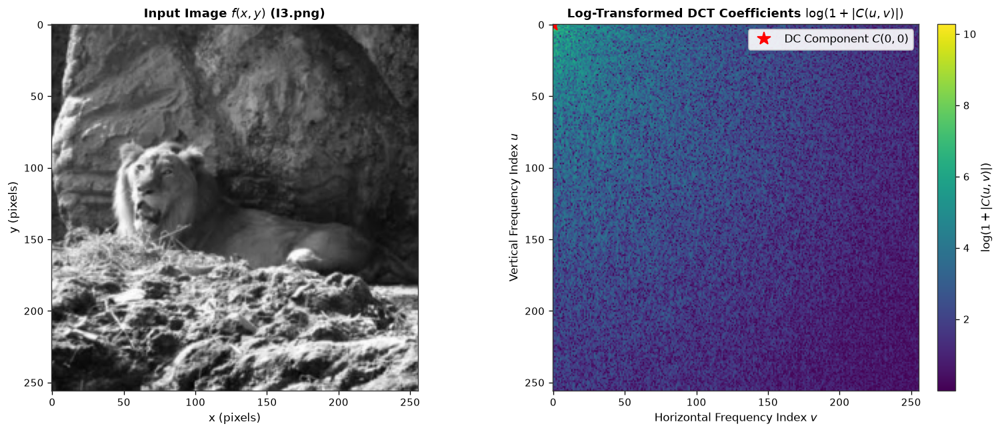

In [14]:
# 4(c) Logarithmic Visualization of DCT Coefficients
log_dct = np.log(1 + np.abs(C_scratch))

fig, axes = plt.subplots(1, 2, figsize=(13, 5.5))

axes[0].imshow(img3, cmap='gray')
axes[0].set_title(r"Input Image $f(x, y)$ (I3.png)", fontsize=11, fontweight='bold')
axes[0].set_xlabel("x (pixels)")
axes[0].set_ylabel("y (pixels)")

im_dct = axes[1].imshow(log_dct, cmap='viridis')
axes[1].set_title(r"Log-Transformed DCT Coefficients $\log(1 + |C(u, v)|)$", fontsize=11, fontweight='bold')
axes[1].set_xlabel(r"Horizontal Frequency Index $v$")
axes[1].set_ylabel(r"Vertical Frequency Index $u$")
fig.colorbar(im_dct, ax=axes[1], fraction=0.046, pad=0.04, label=r"$\log(1 + |C(u, v)|)$")

# Annotate DC coefficient
axes[1].plot(0, 0, 'r*', markersize=12, label=r"DC Component $C(0, 0)$")
axes[1].legend(loc='upper right', framealpha=0.9)

plt.tight_layout()
plt.show()


### 4(d) Radial Energy Compaction $E(r)$ and Plot

In [15]:
# 4(d) Radial Energy Calculation E(r)
u_idx, v_idx = np.meshgrid(np.arange(M3), np.arange(N3), indexing='ij')
r_matrix = np.sqrt(u_idx**2 + v_idx**2)

# Coefficient energy
energy_matrix = C_scratch ** 2
total_energy = np.sum(energy_matrix)

# Evaluate cumulative radial energy for all r
max_radius = int(np.ceil(np.max(r_matrix)))
r_array = np.arange(max_radius + 1)
E_r = np.zeros(len(r_array))

for i, r in enumerate(r_array):
    E_r[i] = np.sum(energy_matrix[r_matrix <= r]) / total_energy

print(f"Total DCT Energy:          {total_energy:.4e}")
print(f"DC Energy C(0, 0)^2:       {C_scratch[0, 0]**2:.4e} ({C_scratch[0, 0]**2 / total_energy * 100:.2f}% of total!)")
print(f"Max Radial Distance r_max: {max_radius} cycles")


Total DCT Energy:          1.0148e+09
DC Energy C(0, 0)^2:       8.5332e+08 (84.09% of total!)
Max Radial Distance r_max: 361 cycles


### 4(e) Smallest Radial Threshold $r$ Retaining $\ge 97.5\%$ Energy

RADIAL ENERGY COMPACTION THRESHOLD REPORT
Target Energy Retention:       97.5%
Selected Radial Threshold r:   51 cycles
Actual Retained Energy:        97.5401%


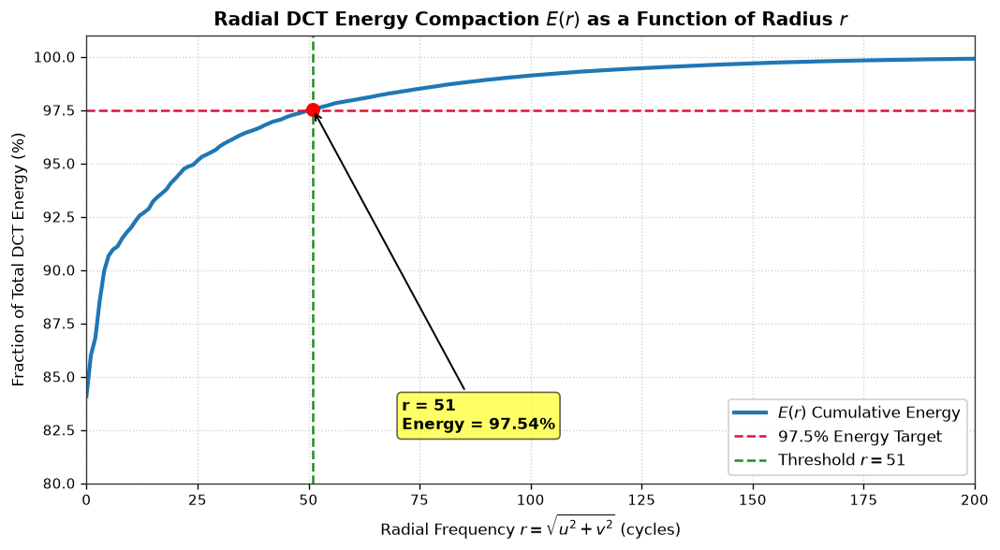

In [16]:
# 4(e) Find Smallest Radial Threshold for >= 97.5% Energy
target_fraction = 0.975
thresh_idx = np.where(E_r >= target_fraction)[0][0]
r_threshold = r_array[thresh_idx]
retained_energy_fraction = E_r[thresh_idx]

print("="*60)
print("RADIAL ENERGY COMPACTION THRESHOLD REPORT")
print("="*60)
print(f"Target Energy Retention:       {target_fraction * 100:.1f}%")
print(f"Selected Radial Threshold r:   {r_threshold} cycles")
print(f"Actual Retained Energy:        {retained_energy_fraction * 100:.4f}%")
print("="*60)

# Plot E(r) as a function of r
fig, ax = plt.subplots(figsize=(9, 5))

ax.plot(r_array, E_r * 100, color='#1f77b4', linewidth=2.5, label=r"$E(r)$ Cumulative Energy")
ax.axhline(97.5, color='crimson', linestyle='--', linewidth=1.5, label="97.5% Energy Target")
ax.axvline(r_threshold, color='forestgreen', linestyle='--', linewidth=1.5, label=f"Threshold $r = {r_threshold}$")
ax.plot(r_threshold, retained_energy_fraction * 100, 'ro', markersize=8)

ax.annotate(f"r = {r_threshold}\nEnergy = {retained_energy_fraction*100:.2f}%", 
            xy=(r_threshold, retained_energy_fraction * 100), 
            xytext=(r_threshold + 20, retained_energy_fraction * 100 - 15),
            arrowprops=dict(arrowstyle="->", color="black", lw=1.2),
            fontsize=10, fontweight='bold', bbox=dict(boxstyle="round,pad=0.3", fc="yellow", alpha=0.6))

ax.set_title(r"Radial DCT Energy Compaction $E(r)$ as a Function of Radius $r$", fontsize=12, fontweight='bold')
ax.set_xlabel(r"Radial Frequency $r = \sqrt{u^2 + v^2}$ (cycles)")
ax.set_ylabel("Fraction of Total DCT Energy (%)")
ax.set_xlim(0, 200)
ax.set_ylim(80, 101)
ax.grid(True, linestyle=':', alpha=0.6)
ax.legend(loc='lower right', framealpha=0.9)

plt.tight_layout()
plt.show()


### 4(f) Coefficient Zeroing, Inverse DCT, Absolute Difference & Analysis

DCT COMPRESSION & RECONSTRUCTION SUMMARY
Total Number of Coefficients:   65536 (100.0%)
Retained Coefficients (r <= 51): 2095 (3.20%)
Zeroed Coefficients   (r > 51):  63441 (96.80%)
Compression Ratio (Coefficient Reduction): 31.28x
Reconstruction PSNR:           22.32 dB
Mean Squared Error (MSE):      380.70
Mean Absolute Difference:      12.94 intensity levels
Maximum Absolute Difference:   114.03 intensity levels


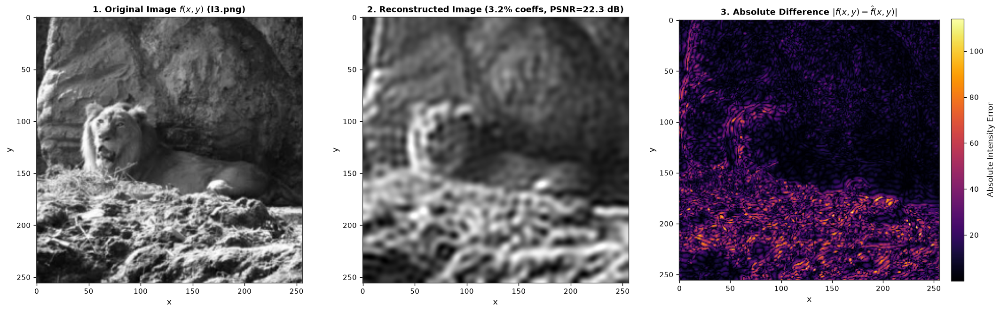

In [17]:
# 4(f) Zero Coefficients Beyond Threshold and Reconstruct
mask_keep = r_matrix <= r_threshold
mask_zero = r_matrix > r_threshold

# Zero out coefficients with r > threshold
C_truncated = C_scratch.copy()
C_truncated[mask_zero] = 0.0

total_coeffs = M3 * N3
zeroed_coeffs = np.sum(mask_zero)
retained_coeffs = np.sum(mask_keep)
fraction_zeroed = zeroed_coeffs / total_coeffs

print("="*65)
print("DCT COMPRESSION & RECONSTRUCTION SUMMARY")
print("="*65)
print(f"Total Number of Coefficients:   {total_coeffs} (100.0%)")
print(f"Retained Coefficients (r <= {r_threshold}): {retained_coeffs} ({retained_coeffs / total_coeffs * 100:.2f}%)")
print(f"Zeroed Coefficients   (r > {r_threshold}):  {zeroed_coeffs} ({fraction_zeroed * 100:.2f}%)")
print(f"Compression Ratio (Coefficient Reduction): {total_coeffs / retained_coeffs:.2f}x")
print("="*65)

# Reconstruct image via from-scratch separable IDCT
img3_reconstructed = idct2_from_scratch(C_truncated)
img3_reconstructed_clipped = np.clip(img3_reconstructed, 0, 255)

# Compute absolute error
abs_diff = np.abs(img3.astype(np.float64) - img3_reconstructed_clipped)

# Quantitative Reconstruction Quality Metrics
mse = np.mean(abs_diff ** 2)
psnr = 10 * np.log10(255.0**2 / mse)
max_err = np.max(abs_diff)
mean_err = np.mean(abs_diff)

print(f"Reconstruction PSNR:           {psnr:.2f} dB")
print(f"Mean Squared Error (MSE):      {mse:.2f}")
print(f"Mean Absolute Difference:      {mean_err:.2f} intensity levels")
print(f"Maximum Absolute Difference:   {max_err:.2f} intensity levels")
print("="*65)

# Visual Comparison: Original, Reconstructed, and Absolute Difference
fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

axes[0].imshow(img3, cmap='gray')
axes[0].set_title(r"1. Original Image $f(x, y)$ (I3.png)", fontsize=11, fontweight='bold')
axes[0].set_xlabel("x")
axes[0].set_ylabel("y")

axes[1].imshow(img3_reconstructed_clipped, cmap='gray')
axes[1].set_title(f"2. Reconstructed Image (3.2% coeffs, PSNR={psnr:.1f} dB)", fontsize=11, fontweight='bold')
axes[1].set_xlabel("x")
axes[1].set_ylabel("y")

im_err = axes[2].imshow(abs_diff, cmap='inferno')
axes[2].set_title(r"3. Absolute Difference $|f(x, y) - \hat{f}(x, y)|$", fontsize=11, fontweight='bold')
axes[2].set_xlabel("x")
axes[2].set_ylabel("y")
fig.colorbar(im_err, ax=axes[2], fraction=0.046, pad=0.04, label="Absolute Intensity Error")

plt.tight_layout()
plt.show()
